# 2 Exploratory Data Analysis<a id='2_Data_wrangling'></a>

Start with trimmed set of columns of ps_performance and concordance results visualized mainly in Tibco Spotfire file:
/git_repositories/DataScienceCapstoneTwo/spotfire/data_cleaning_step2_EDA.dxp

This file has removed most of the unnecessary columns and highly correlated columns to remaining metrics.

In [1]:
import pandas as pd
import seaborn as sns

## 2.1 Load and inspect data

In [33]:
ps_data = pd.read_csv('../data/data_cleaning_step2.zip',sep='\t')

In [34]:
ps_data.head(7).transpose()

,0,1,2,3,4,5,6
probeset_id,AX-100003653,AX-100004573,AX-100004941,AX-100006840,AX-100007392,AX-100007701,AX-100008742
quality_bin,high,low,high,low,high,low,marginal
quality_score,4.463,0.733,5.0,2.638,4.68,1.968,4.12
OriginalCT.recommended,True,False,True,True,True,True,False
OriginalCT,PolyHighResolution,Other,MonoHighResolution,PolyHighResolution,PolyHighResolution,PolyHighResolution,Other
CC,0.996,0.953,1.0,0.975,0.996,0.963,0.989
CR,98.913,97.464,100.0,98.188,100.0,99.638,100.0
FLD,6.761,3.694,NaN,4.352,6.359,7.161,NaN
HetSO,0.745,-0.28,NaN,0.421,0.36,0.161,NaN
Nclus,3,2,1,3,3,3,1


In [35]:
ps_data.dtypes

probeset_id                object
quality_bin                object
quality_score             float64
OriginalCT.recommended       bool
OriginalCT                 object
CC                        float64
CR                        float64
FLD                       float64
HetSO                     float64
Nclus                       int64
MMD                       float64
het_frac                  float64
MinorAlleleFrequency      float64
H.W.p-Value               float64
AA.meanX.clean            float64
AB.meanX.abs_clean        float64
BB.meanX.clean            float64
HomRO                     float64
AA.meanY.clean            float64
AB.meanY.clean            float64
BB.meanY.clean            float64
meanY                     float64
Hom.meanY.delta           float64
AA.varX.clean             float64
AB.varX.clean             float64
BB.varX.clean             float64
AA.varY.clean             float64
AB.varY.clean             float64
BB.varY.clean             float64
dtype: object

In [36]:
# Some metrics are only computed for certain categories of probeset, 
missing = pd.concat([ps_data.isnull().sum(), 100 * ps_data.isnull().mean()], axis=1)
missing.columns=['count_missing', 'frac_missing']
missing.sort_values(by='count_missing',ascending = False)

,count_missing,frac_missing
MMD,549639,68.011582
AA.meanX.clean,340804,42.170623
AA.varY.clean,340804,42.170623
AA.varX.clean,340804,42.170623
AA.meanY.clean,340804,42.170623
BB.varX.clean,208499,25.799383
BB.meanY.clean,208499,25.799383
BB.meanX.clean,208499,25.799383
BB.varY.clean,208499,25.799383
FLD,30841,3.816223


In [37]:
cols = ps_data.columns
cols

Index(['probeset_id', 'quality_bin', 'quality_score', 'OriginalCT.recommended',
       'OriginalCT', 'CC', 'CR', 'FLD', 'HetSO', 'Nclus', 'MMD', 'het_frac',
       'MinorAlleleFrequency', 'H.W.p-Value', 'AA.meanX.clean',
       'AB.meanX.abs_clean', 'BB.meanX.clean', 'HomRO', 'AA.meanY.clean',
       'AB.meanY.clean', 'BB.meanY.clean', 'meanY', 'Hom.meanY.delta',
       'AA.varX.clean', 'AB.varX.clean', 'BB.varX.clean', 'AA.varY.clean',
       'AB.varY.clean', 'BB.varY.clean'],
      dtype='object')

In [38]:
#select columns to pairwise plot.  Drop columns with only 2 or 3 values
#cols_plot = cols.drop(['OriginalCT.recommended','CC','Nclus'])[::-1]   # reverse columns
cols_plot = cols.drop(['CC','Nclus'])
cols_plot

Index(['probeset_id', 'quality_bin', 'quality_score', 'OriginalCT.recommended',
       'OriginalCT', 'CR', 'FLD', 'HetSO', 'MMD', 'het_frac',
       'MinorAlleleFrequency', 'H.W.p-Value', 'AA.meanX.clean',
       'AB.meanX.abs_clean', 'BB.meanX.clean', 'HomRO', 'AA.meanY.clean',
       'AB.meanY.clean', 'BB.meanY.clean', 'meanY', 'Hom.meanY.delta',
       'AA.varX.clean', 'AB.varX.clean', 'BB.varX.clean', 'AA.varY.clean',
       'AB.varY.clean', 'BB.varY.clean'],
      dtype='object')

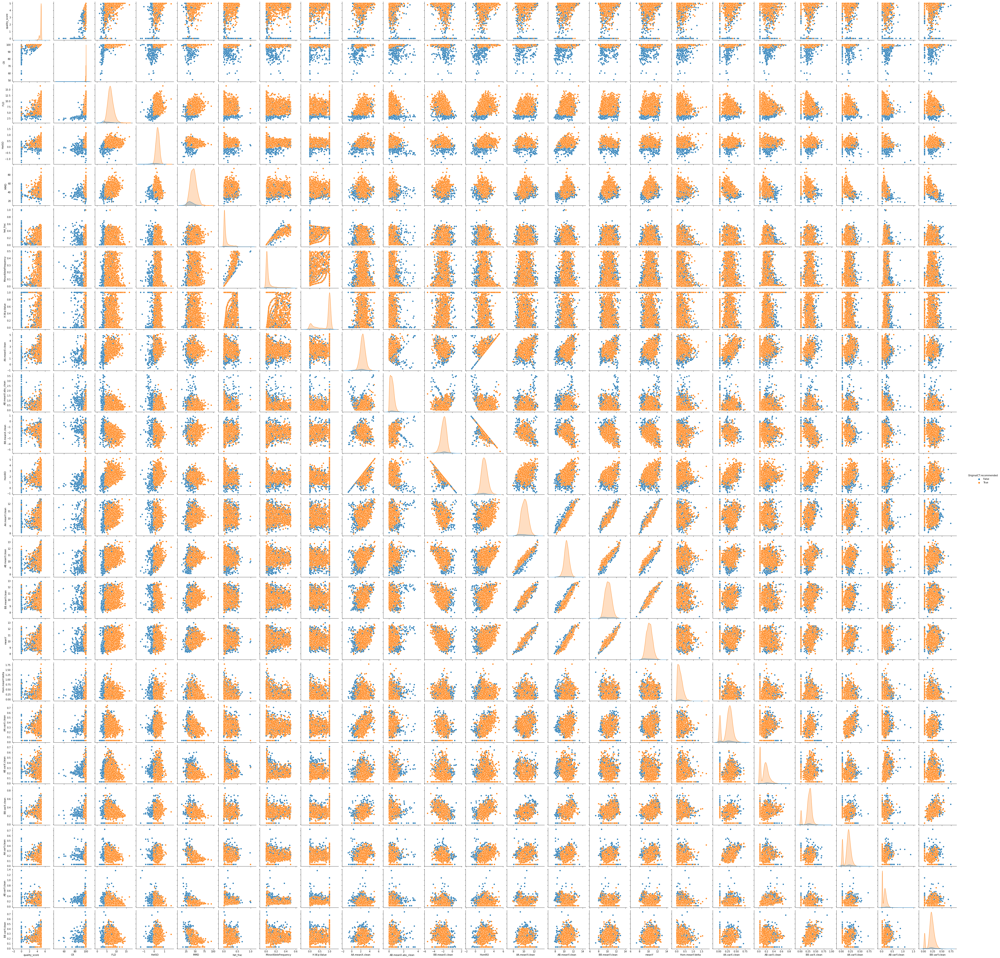

In [39]:
# dropna=False (default) because this drops rows if at least one plotted variable is NA, and have much missing data
# corner=False (default) don't only plot lower triangle to maybe speed up, because harder to scan through
#_ = sns.pairplot(ps_data[cols_plot].sample(frac=0.02),corner=True,diag_kind='kde',dropna=False)
#_ = sns.pairplot(ps_data[cols_plot].sample(frac=0.02),diag_kind='kde')
_ = sns.pairplot(ps_data[cols_plot].sample(n=10000),diag_kind='kde',hue='OriginalCT.recommended')